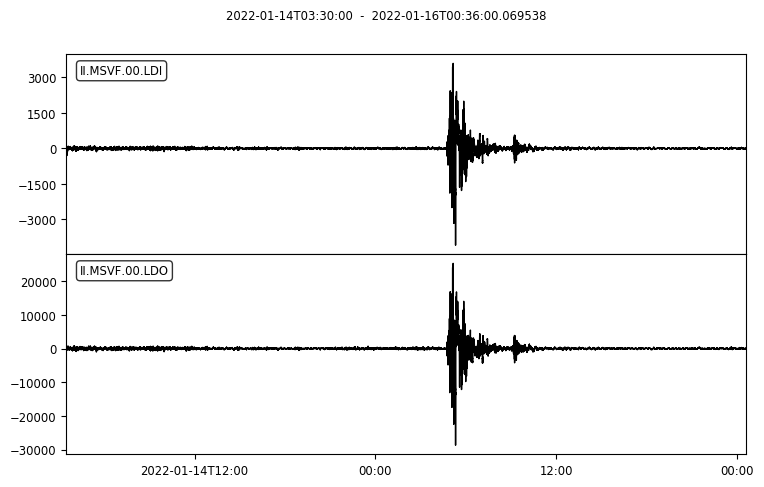

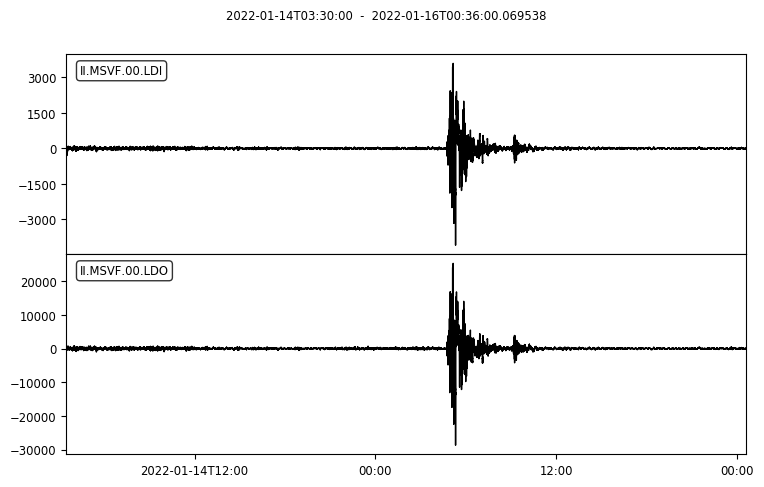

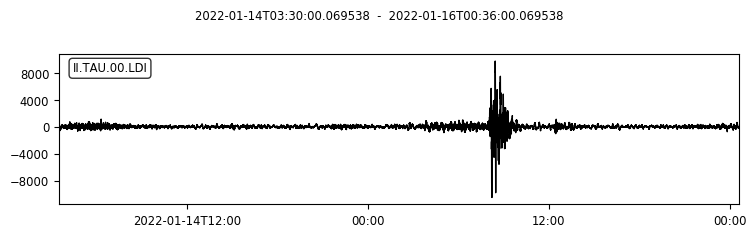

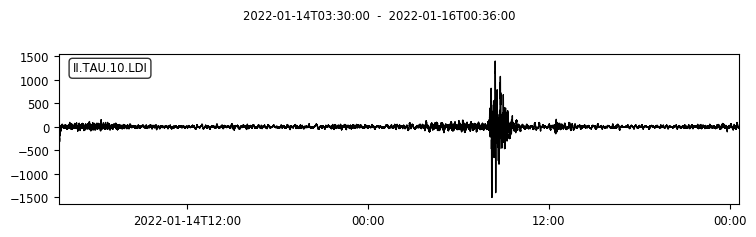

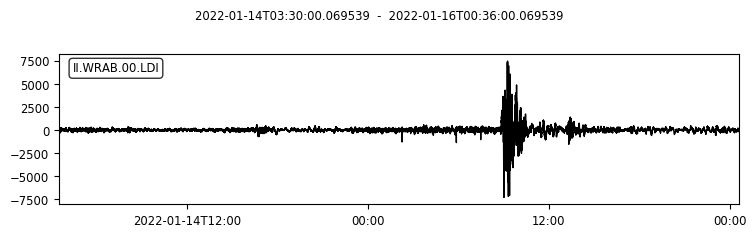

...

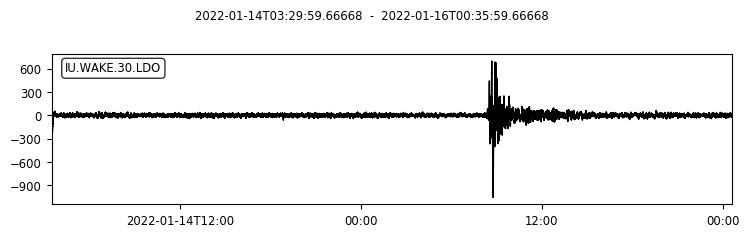

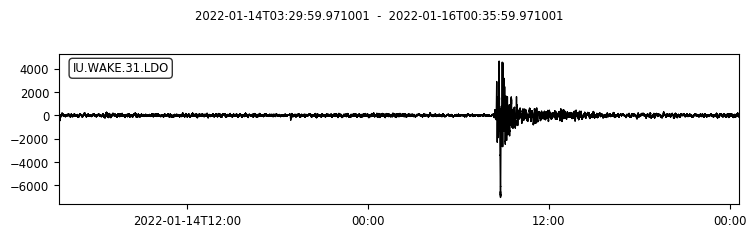

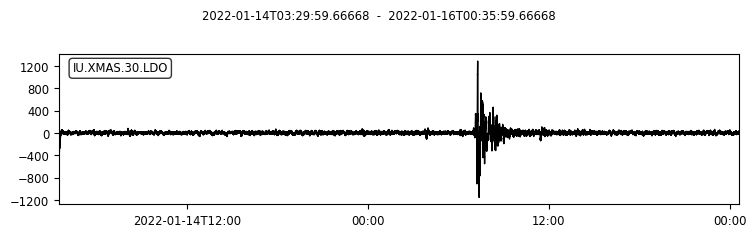

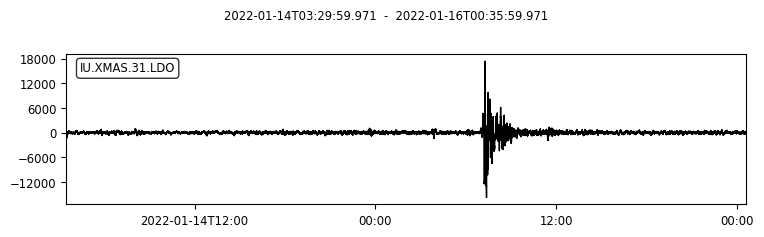

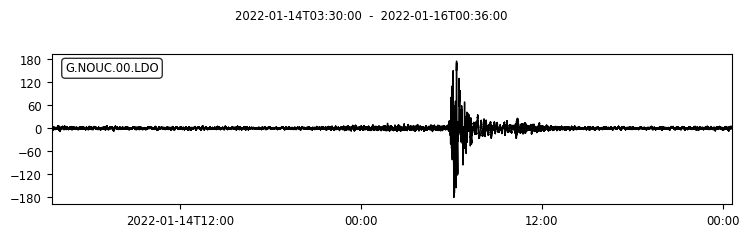

In [43]:
import os, obspy
from obspy.clients.fdsn import Client
irisclient = Client("IRIS")
DATA_ROOT = '/home/thompsong/DATA/Tonga202201'

stiris = obspy.core.read(os.path.join(DATA_ROOT, 'MINISEED', '2022-01-15-ms_2058-tonga-islands.miniseed'))
#stiris.select(channel='?D?').plot(equal_scale=False)

startt = obspy.core.UTCDateTime("2022-01-14T03:00:00.000") 
endt = startt = 2 * 86400
for tr in stiris.select(channel='?D?'):
    fname = os.path.join(DATA_ROOT, 'MINISEED', 'irisdata.%s.mseed' % tr.id)
    if os.path.exists(fname):
        st = obspy.core.read(fname)
    else:
        st = irisclient.get_waveforms(tr.stats.network, tr.stats.station, tr.stats.location, "LD?", startt, endt)

        st.write(fname)
    st.trim(starttime=t+1800, endtime=t+1.9*86400).plot(equal_scale=False)

In [41]:
import sys
LIBpath = os.path.join( os.getenv('HOME'),'src','kitchensinkGT', 'LIB')
sys.path.append(LIBpath)
from libseisGT import inventory2traceid, get_FDSN_inventory, \
    get_FDSN_Stream, clean_trace #, attach_station_coordinates_from_inventory, 
stationXmlFile = 'BDO_within_50degrees.xml'
searchRadiusDeg = 51.0
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:30:00.000000Z')
startt = otime
endt = otime + 2 * 86400
inv = get_FDSN_inventory(irisclient, startt - 5401, stationXmlFile, '*', olat, olon, \
    searchRadiusDeg, 0, endt - startt + 1, channel = '?D?' )

Trying to load inventory from 2022/01/15 02:59 to 2022/01/17 03:00
inventory saved to BDO_within_50degrees.xml


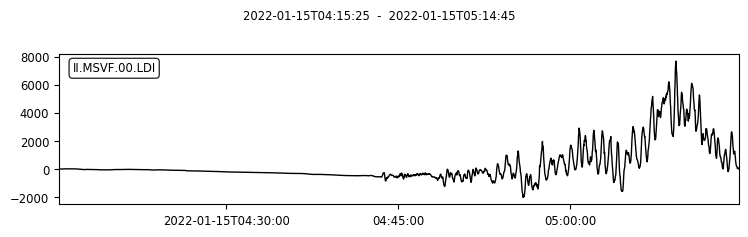

Could not correct instrument response. Filtered instead


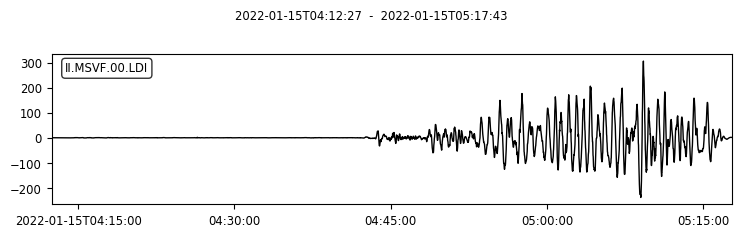

max amp = 7679 counts before, and 305.9 units after


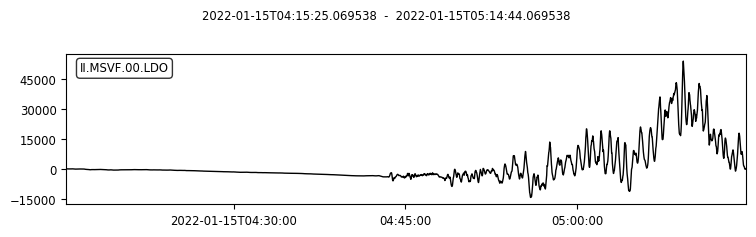

Could not correct instrument response. Filtered instead


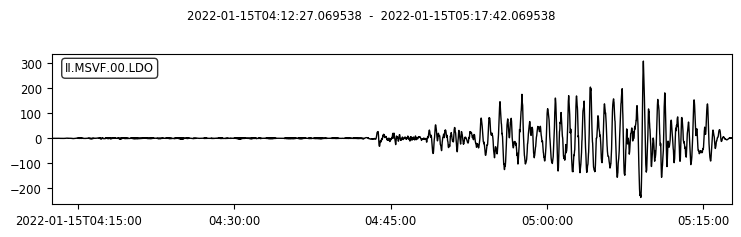

max amp = 53872 counts before, and 308.7 units after


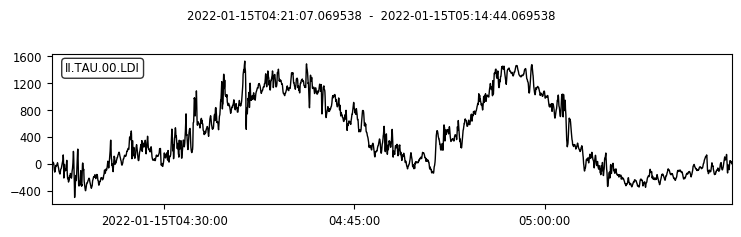

Could not correct instrument response. Filtered instead


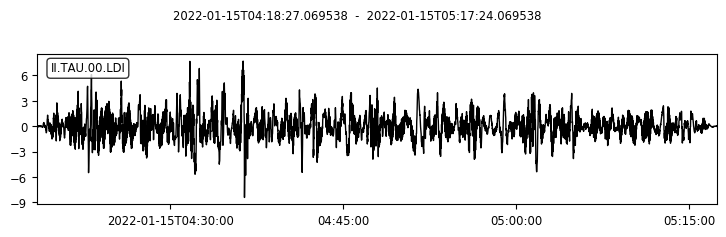

max amp = 1525 counts before, and 8.4 units after


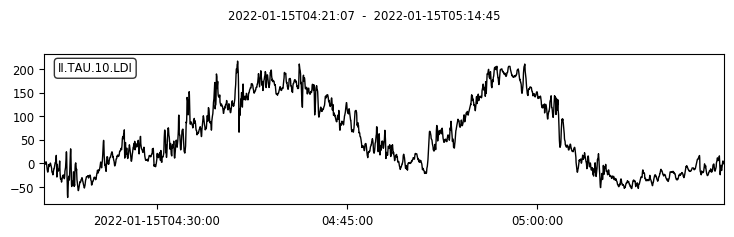

Could not correct instrument response. Filtered instead


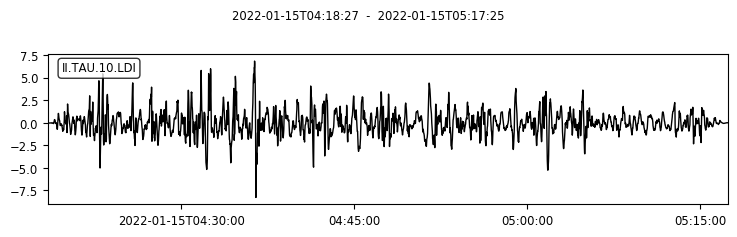

max amp = 217 counts before, and 8.3 units after


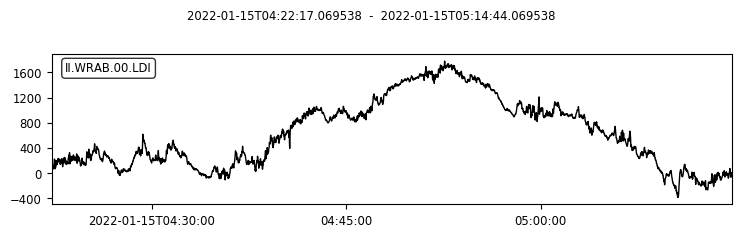

Could not correct instrument response. Filtered instead


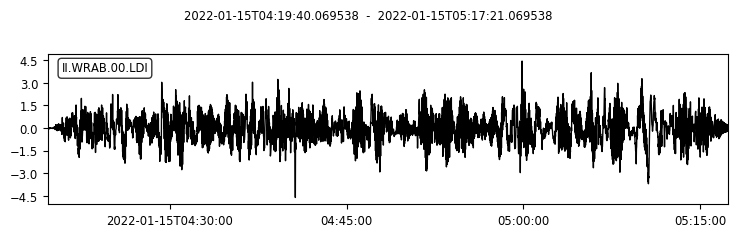

max amp = 1782 counts before, and 4.6 units after


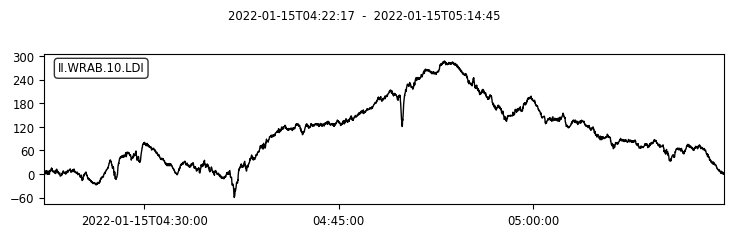

Could not correct instrument response. Filtered instead


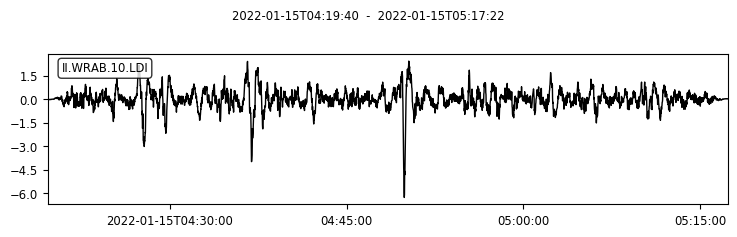

max amp = 287 counts before, and 6.3 units after


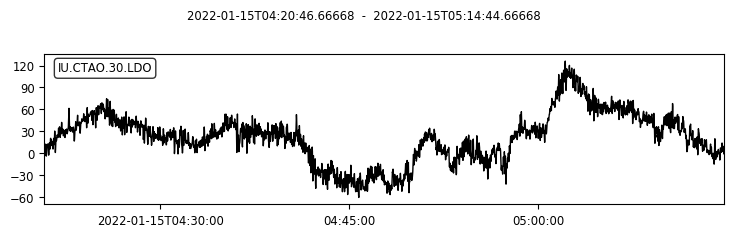

Could not correct instrument response. Filtered instead


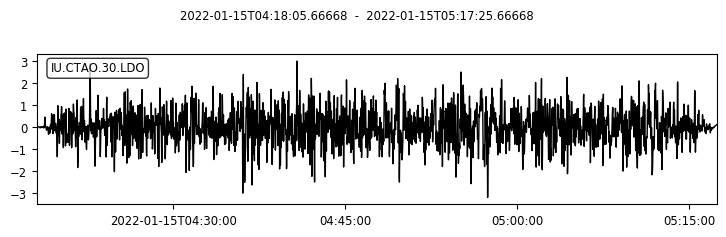

max amp = 126 counts before, and 3.2 units after


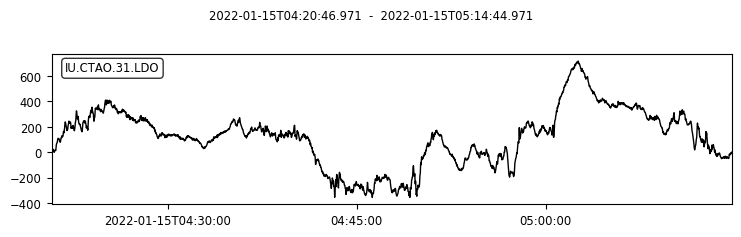

Could not correct instrument response. Filtered instead


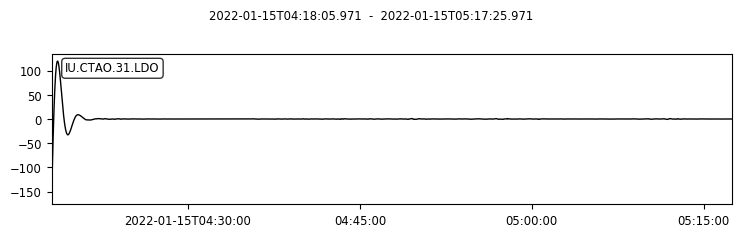

max amp = 717 counts before, and 162.2 units after


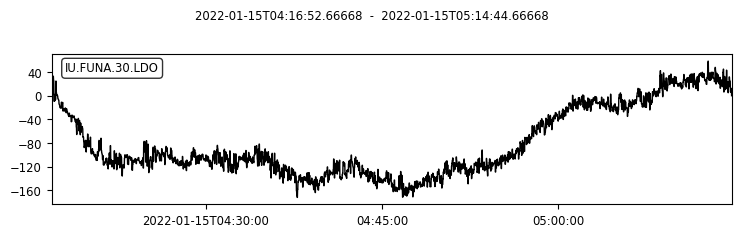

Could not correct instrument response. Filtered instead


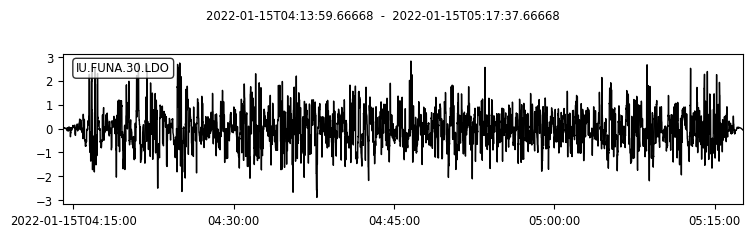

max amp = 172 counts before, and 2.9 units after


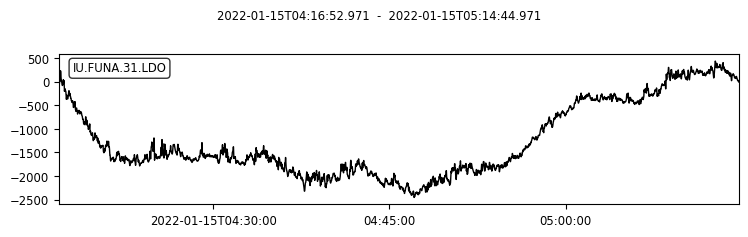

Could not correct instrument response. Filtered instead


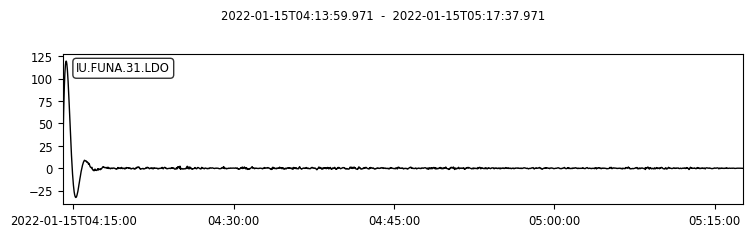

max amp = 2456 counts before, and 119.7 units after


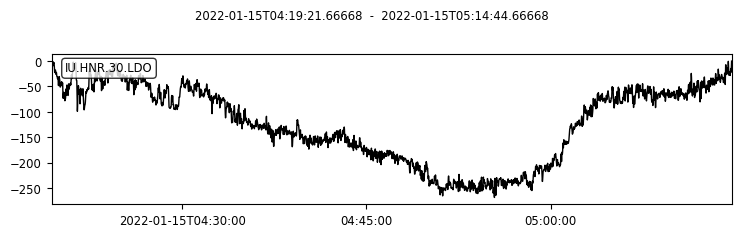

Could not correct instrument response. Filtered instead


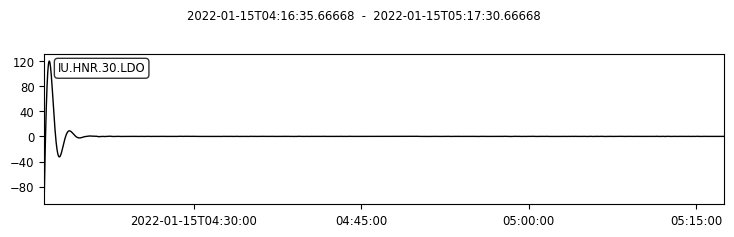

max amp = 269 counts before, and 119.7 units after


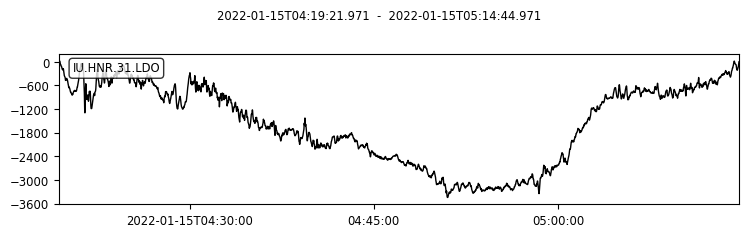

Could not correct instrument response. Filtered instead


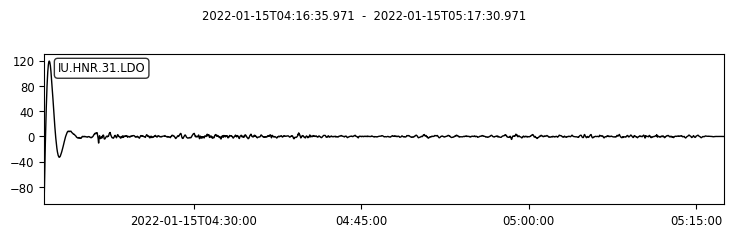

max amp = 3446 counts before, and 119.1 units after


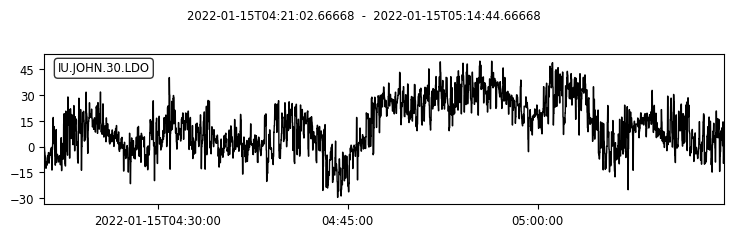

Could not correct instrument response. Filtered instead


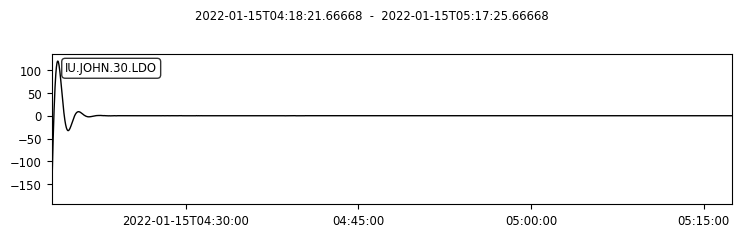

max amp = 50 counts before, and 179.0 units after


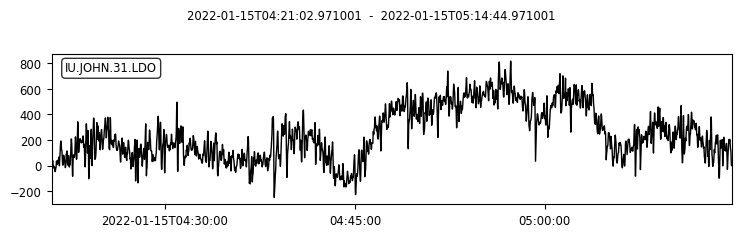

Could not correct instrument response. Filtered instead


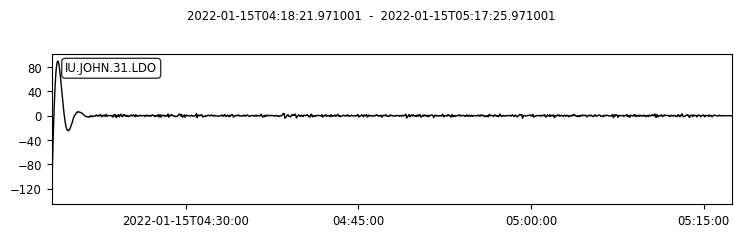

max amp = 817 counts before, and 134.3 units after


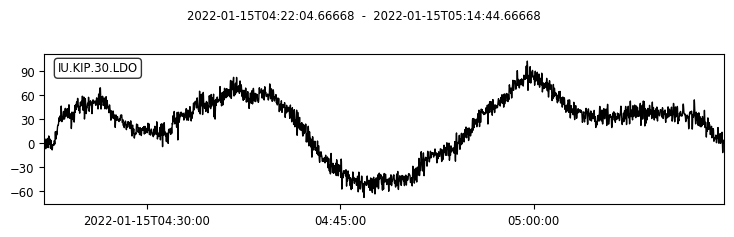

Could not correct instrument response. Filtered instead


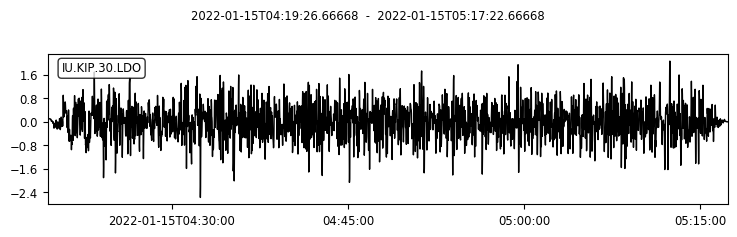

max amp = 102 counts before, and 2.6 units after


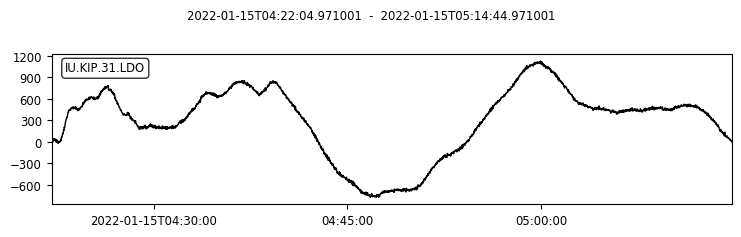

Could not correct instrument response. Filtered instead


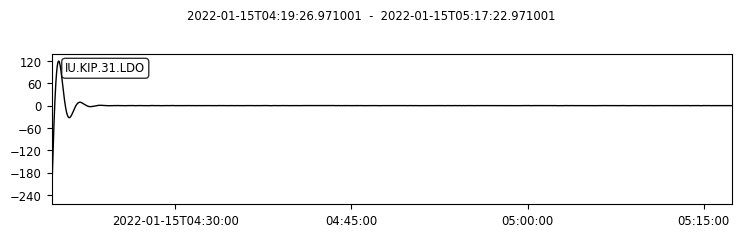

max amp = 1128 counts before, and 246.6 units after


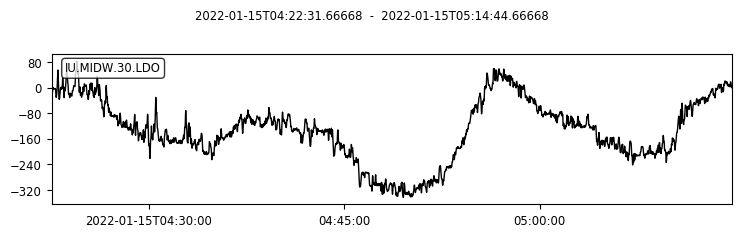

Could not correct instrument response. Filtered instead


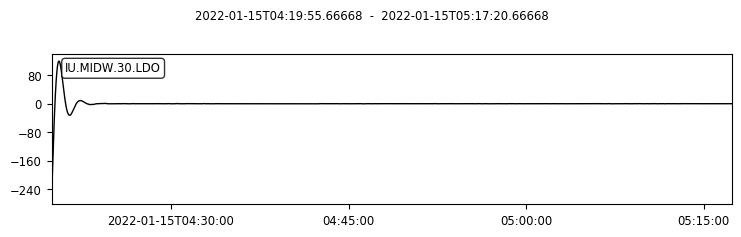

max amp = 343 counts before, and 263.4 units after


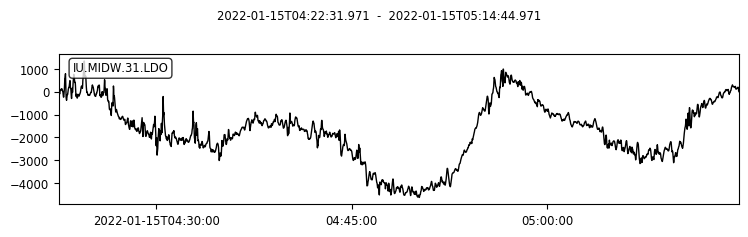

Could not correct instrument response. Filtered instead


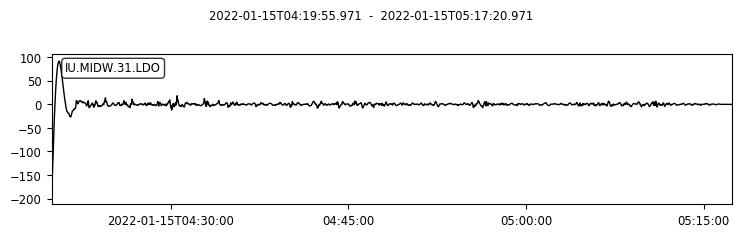

max amp = 4629 counts before, and 197.6 units after


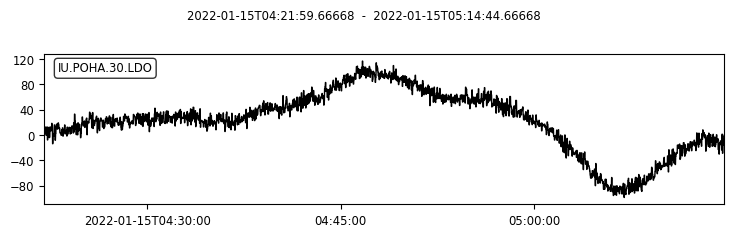

Could not correct instrument response. Filtered instead


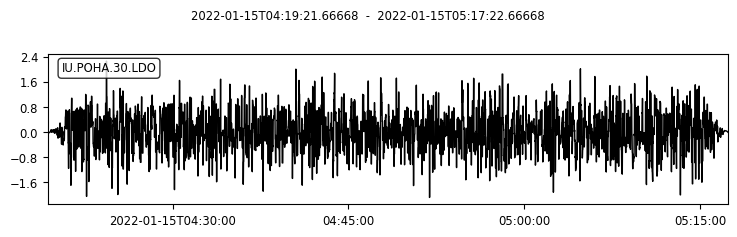

max amp = 117 counts before, and 2.3 units after


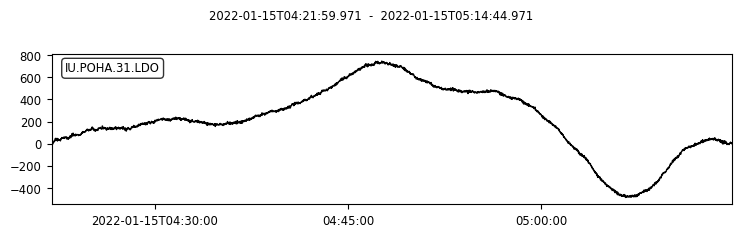

Could not correct instrument response. Filtered instead


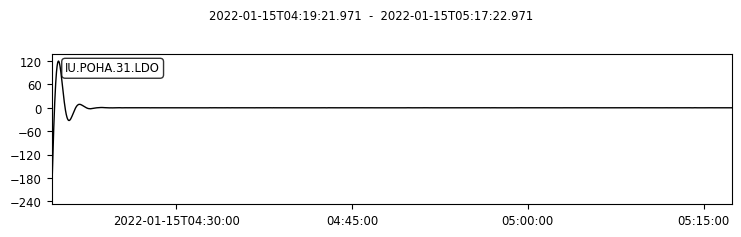

max amp = 747 counts before, and 229.9 units after


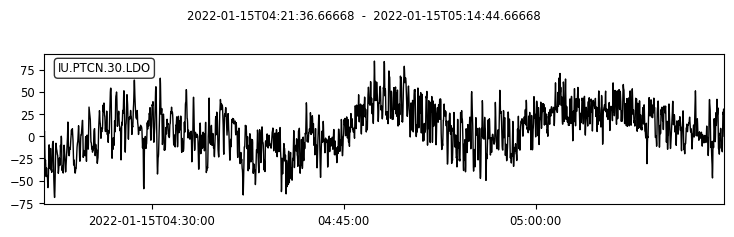

Could not correct instrument response. Filtered instead


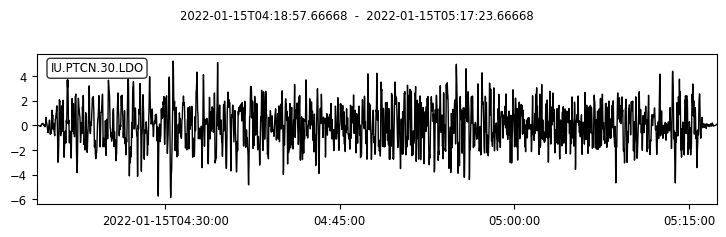

max amp = 85 counts before, and 5.9 units after


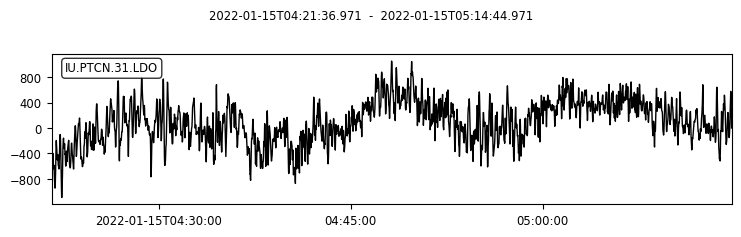

Could not correct instrument response. Filtered instead


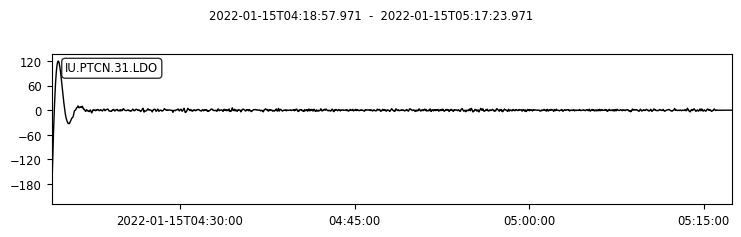

max amp = 1091 counts before, and 212.9 units after


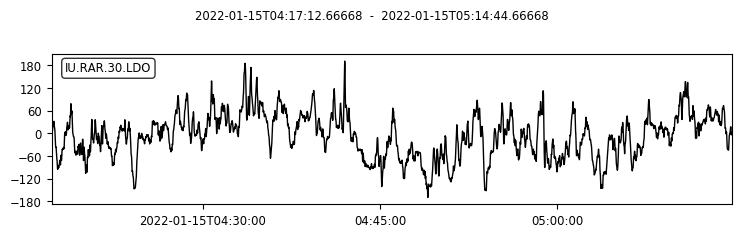

Could not correct instrument response. Filtered instead


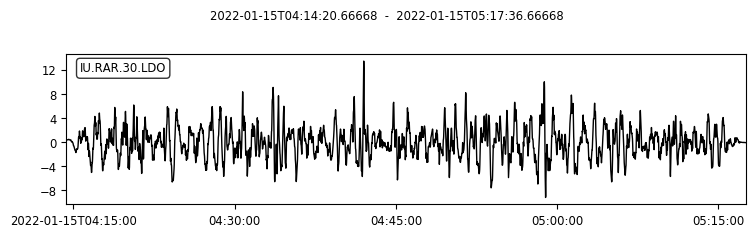

max amp = 192 counts before, and 13.4 units after


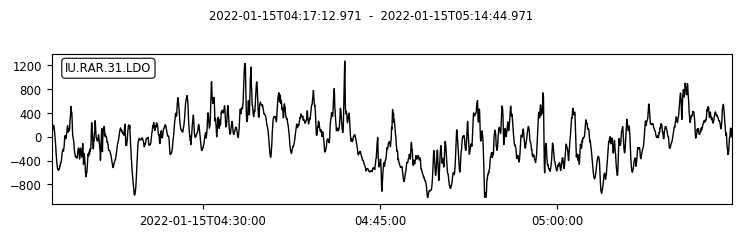

Could not correct instrument response. Filtered instead


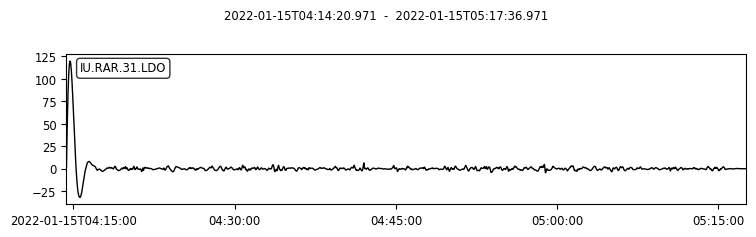

max amp = 1267 counts before, and 119.9 units after


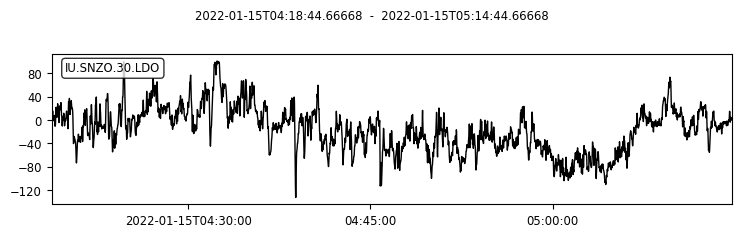

Could not correct instrument response. Filtered instead


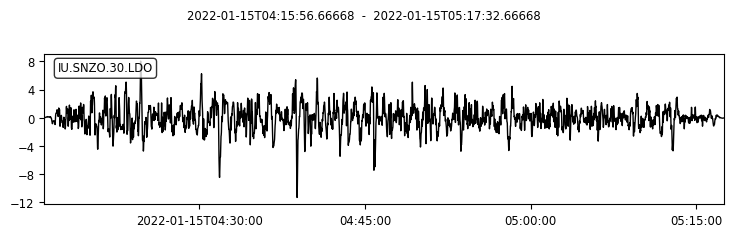

max amp = 133 counts before, and 11.3 units after


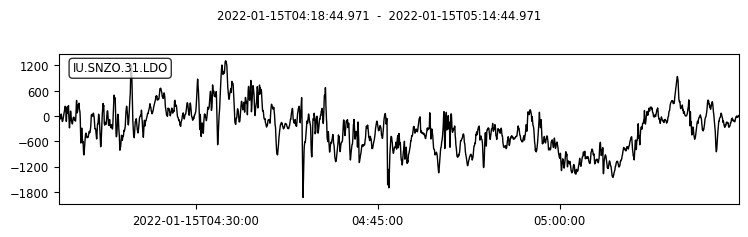

Could not correct instrument response. Filtered instead


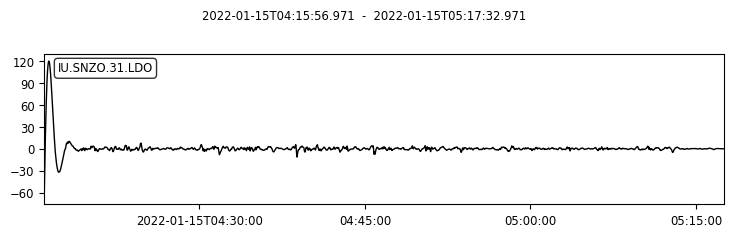

max amp = 1927 counts before, and 119.8 units after


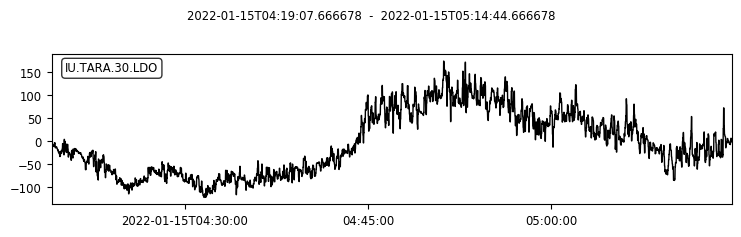

Could not correct instrument response. Filtered instead


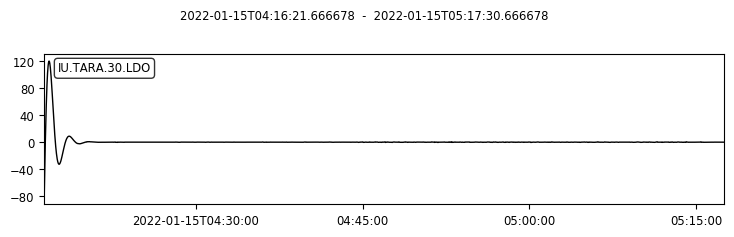

max amp = 175 counts before, and 119.7 units after


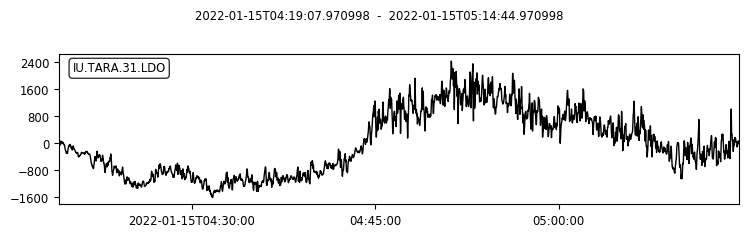

Could not correct instrument response. Filtered instead


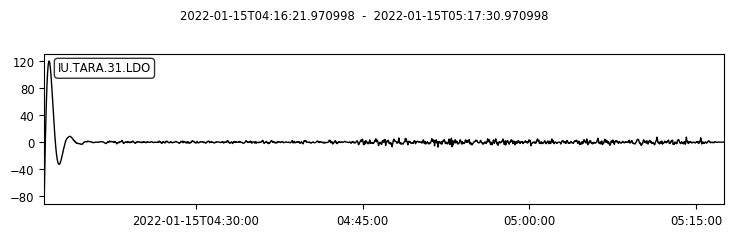

max amp = 2423 counts before, and 119.7 units after


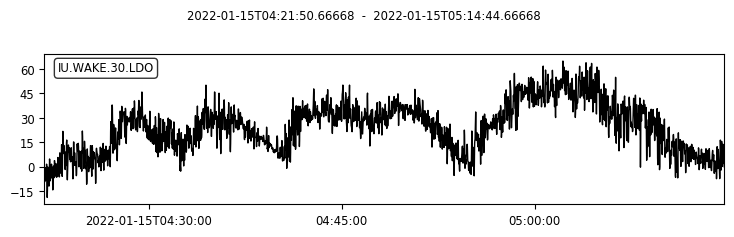

Could not correct instrument response. Filtered instead


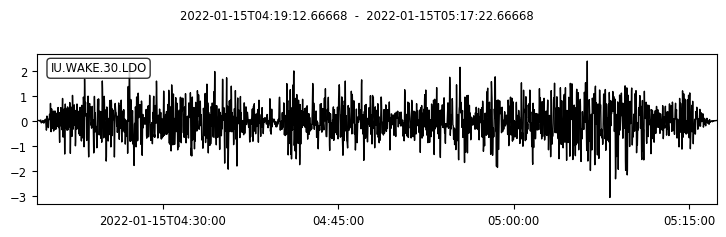

max amp = 65 counts before, and 3.1 units after


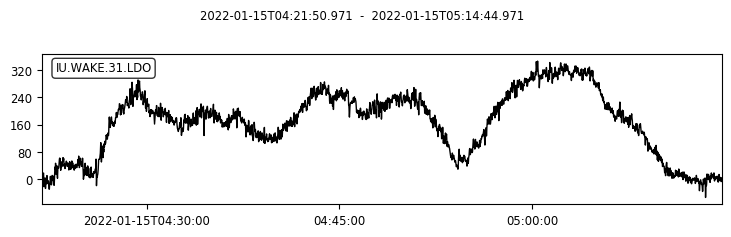

Could not correct instrument response. Filtered instead


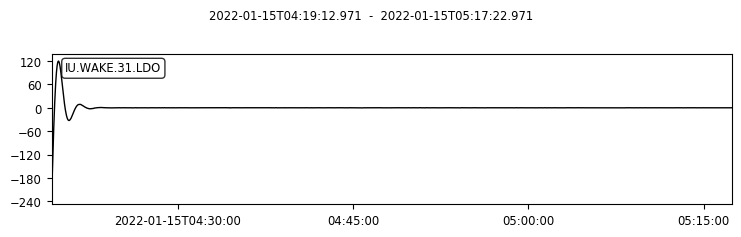

max amp = 346 counts before, and 229.9 units after


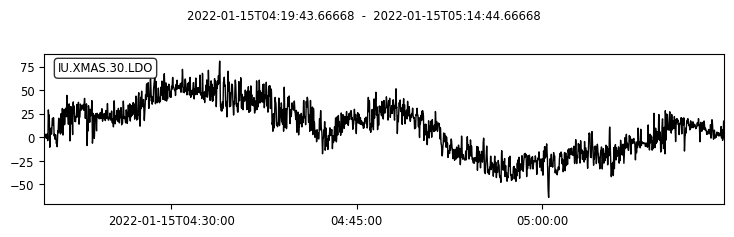

Could not correct instrument response. Filtered instead


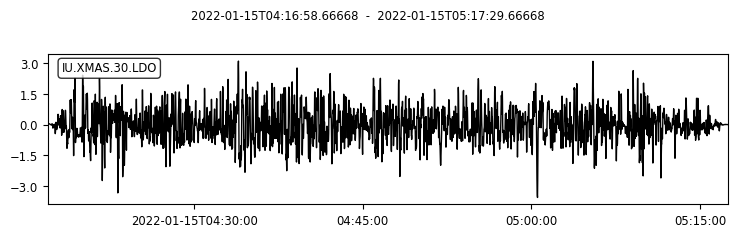

max amp = 81 counts before, and 3.6 units after


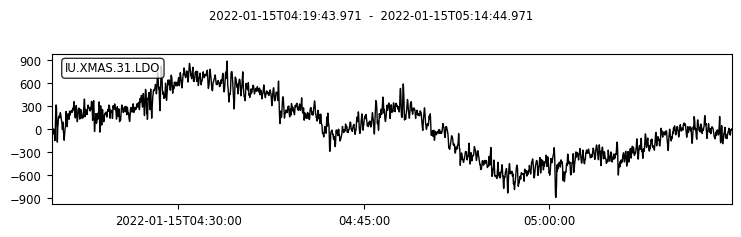

Could not correct instrument response. Filtered instead


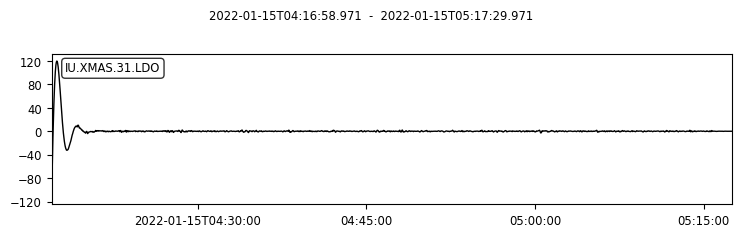

max amp = 894 counts before, and 119.6 units after


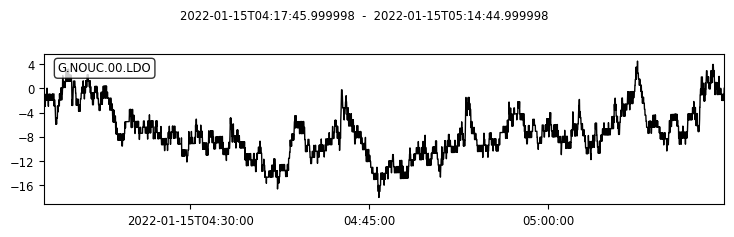

No matching response info found for G.NOUC.00.LDO
Instrument response applied


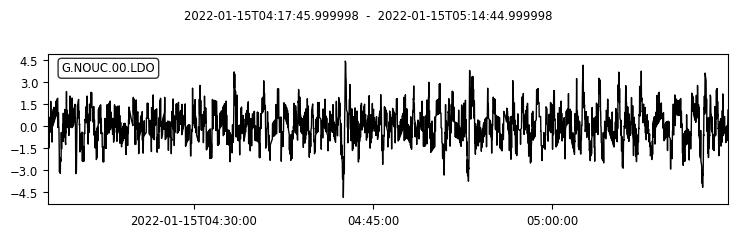

max amp = 18 counts before, and 4.9 units after


In [49]:
import numpy as np
#from obspy.signal.trigger import classic_sta_lta, plot_trigger, recursive_sta_lta, delayed_sta_lta
for tr_original in stiris.select(channel='?D?'):
    #df = tr.stats.sampling_rate
    #LTA = 500 # s
    #STA = 100 # s
    #cft = classic_sta_lta(tr.data, int(STA * df), int(LTA * df))
    #plot_trigger(tr, cft, 1.0, 0.5)                
    #tr.detrend('linear')
    #tr.filter('highpass', freq=0.001, corners=2)
    #try:
        tr = tr_original.copy()
        tr.detrend()
        tr.plot()
        maxcounts = np.max(np.abs(tr.data))
        try:
            clean_trace(tr, taperFraction=0.05, filterType="highpass", freq=0.01, \
                corners=4, zerophase=True, inv=inv) 
            print('Instrument response applied')
        except:
            clean_trace(tr, taperFraction=0.05, filterType="highpass", freq=0.01, \
                corners=4, zerophase=True, inv=None) 
            print('Could not correct instrument response. Filtered instead')
        maxunits = np.max(np.abs(tr.data))

        if maxunits/maxcounts > 0.98 and maxunits/maxcounts < 1.02:
            # probably no calib applied
            print(tr.stats.calib)
            response = inv.get_response(tr.id, otime)
            calib = response.instrument_sensitivity.value 
            print('calib = %f' % calib)
            tr.data = tr.data * calib
            maxunits = np.max(np.abs(tr.data))
        tr.plot();
        print('max amp = %.0f counts before, and %.1f units after' % (maxcounts, maxunits))        
    #except:
    #    pass

In [13]:
print(inv)

Inventory created at 2022-02-03T14:23:01.488000Z
	Created by: IRIS WEB SERVICE: fdsnws-station | version: 1.1.48
		    http://service.iris.edu/fdsnws/station/1/query?starttime=2022-01-15...
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (9):
			AU, G, HV, II, IM, IU, MH, PS, UH
		Stations (97):
			AU.I07H1 (Warramunga Infrasonic Array, Site I07H1, Australia)
			AU.I07H2 (Warramunga Infrasonic Array, Site I07H2, Australia)
			AU.I07H3 (Warramunga Infrasonic Array, Site I07H3, Australia)
			AU.I07H4 (Warramunga Infrasonic Array, Site I07H4, Australia)
			AU.I07H5 (Warramunga Infrasonic Array, Site I07H5, Australia)
			AU.I07H6 (Warramunga Infrasonic Array, Site I07H6, Australia)
			AU.I07H7 (Warramunga Infrasonic Array, Site I07H7, Australia)
			AU.I07H8 (Warramunga Infrasonic Array, Site I07H8, Australia)
			G.FUTU (Maopo'opo, Futuna)
			G.NOUC (Port Laguerre - New Caledonia, France)
			HV.AHUD (Ahua, Hawaii Digital)
			HV.WALE (Nanawale Estates)
			II.KWJN (Gagan, Kwaj

In [20]:
for tr in stiris.select(channel='?D?'):
    inv2 = irisclient.get_inventory(tr.stats.network, tr.stats.station, tr.stats.location, tr.stats.channel) 

AttributeError: 'Client' object has no attribute 'get_inventory'

In [21]:
print(irisclient)

FDSN Webservice Client (base url: http://service.iris.edu)
Available Services: 'dataselect' (v1.1.9), 'event' (v1.1.13), 'station' (v1.1.48), 'available_event_catalogs', 'available_event_contributors'

Use e.g. client.help('dataselect') for the
parameter description of the individual services
or client.help() for parameter description of
all webservices.


In [24]:
irisclient.help('station')

Parameter description for the 'station' service (v1.1.48) of 'http://service.iris.edu':
The service offers the following optional standard parameters:
    startbefore (UTCDateTime)
        limit to stations starting before the specified time
    startafter (UTCDateTime)
        limit to stations starting after the specified time
    endbefore (UTCDateTime)
        limit to stations ending before the specified time
    endafter (UTCDateTime)
        limit to stations ending after the specified time
    latitude (float)
        Specify the central latitude point for a radial search
    longitude (float)
        Specify the central longitude point for a radial search
    minradius (float)
        Specify maximum distance from the geographic point defined by latitude
        and longitude
    maxradius (float), Default value: 180.0
        Specify minimum distance from the geographic point defined by latitude
        and longitude
    includerestricted (bool), Default value: True
    inclu

In [35]:
from obspy import read_inventory, UTCDateTime


response = inv.get_response('II.MSVF.00.LDI', otime)

print(tr.stats.calib)
calib = response.instrument_sensitivity.value 


Channel Response
	From Pa (Pressure in Pascals) to counts (Digital Counts)
	Overall Sensitivity: 10.0001 defined at 0.002 Hz
	4 stages:
		Stage 1: PolesZerosResponseStage from Pa to V, gain: 0.0015259
		Stage 2: PolesZerosResponseStage from V to V, gain: 1
		Stage 3: CoefficientsTypeResponseStage from V to counts, gain: 6553.6
		Stage 4: CoefficientsTypeResponseStage from counts to counts, gain: 1


In [29]:
419480*0.000166

69.63368

In [38]:
response.instrument_sensitivity.value

10.0001

In [37]:
response.recalculate_overall_sensitivity(0.1)

ValueError: ObsPy does not know how to map unit 'Pa' to displacement, velocity, or acceleration - overall sensitivity will not be recalculated.

In [ ]:
import os, sys, obspy
LIBpath = os.path.join( os.getenv('HOME'),'src','kitchensinkGT', 'LIB')
sys.path.append(LIBpath)
from libseisGT import inventory2traceid, get_FDSN_inventory, clean_trace #, attach_station_coordinates_from_inventory, 
from obspy.clients.fdsn import Client

    
def get_inventory_and_waveforms(fdsnClient, searchRadiusDeg, olat, olon, startt, endt, chanstring, data_root, overwrite=False):
    if not os.path.isdir(data_root):
        print('No such directory %s' % data_root)
        return None, None
    
    # STEP 1 - FIND STATIONS BY REQUESTING AN INVENTORY
    stationXmlFile = os.path.join(data_root, '%s_within_%.0f_degrees.xml' % (chanstring, searchRadiusDeg))
    mseedfile = stationXmlFile.replace('.xml','.mseed')
    print(stationXmlFile, mseedfile)
    
    if os.path.exists(stationXmlFile) and overwrite==False:
        inv = obspy.read_inventory(stationXmlFile)
    else:
        inv = get_FDSN_inventory(fdsnClient, startt, stationXmlFile, '*', olat, olon, \
            searchRadiusDeg, 0, endt - startt, channel = chanstring ) # get all low rate, outside barometers
    trace_ids = inventory2traceid(inv)
    print(trace_ids)
    
    # STEP 2 - LOAD CORRESPONDING WAVEFORM DATA
    if os.path.exists(mseedfile) and overwrite==False:
        st = obspy.core.read(mseedfile)
    else:
        st = obspy.core.Stream()
        for trace_id in trace_ids:
            try:
                net, sta, loc, cha = trace_id.split('.')
            except:
                net, sta, cha = trace_id.split('.')
                loc = '*'
            try:
                st0 = fdsnClient.get_waveforms(net, sta, loc, cha, startt, endt)
                print('waveform downloaded for ', trace_id)
                if len(st0)==1:
                    st.append(st0[0])
                else:
                    print('More than 1 Trace')
                    last_id = ''
                    for tr0 in st0:
                        if tr0.id != last_id:
                            st.append(tr0)
                        else:
                            st.remove(st[-1])
            except:
                print('failed to download waveform for ', trace_id)

        # save waveform data
        if len(st)>0:
            st.write(stationXmlFile.replace('.xml','.mseed'))
        
    return st, inv

In [107]:
fdsnClient = Client("IRIS")
DATA_ROOT = '/home/thompsong/DATA/Tonga202201'
searchRadiusDeg = 50.0

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt = otime
endt = otime + 7 * 3600 # get 34 hours of data, since this is approximate time for sound waves to circle the earth


chanstring = 'LDO'
st, inv = get_inventory_and_waveforms(fdsnClient, searchRadiusDeg, olat, olon, startt, endt, chanstring, DATA_ROOT, overwrite=True)

/home/thompsong/DATA/Tonga202201/LDO_within_50_degrees.xml /home/thompsong/DATA/Tonga202201/LDO_within_50_degrees.mseed
Trying to load inventory from 2022/01/15 04:14 to 2022/01/15 11:14
inventory saved to /home/thompsong/DATA/Tonga202201/LDO_within_50_degrees.xml
['G.NOUC.LDO', 'II.KWJN.LDO', 'II.MSVF.LDO', 'IU.AFI.LDO', 'IU.AFI.LDO', 'IU.AFI.LDO', 'IU.CTAO.LDO', 'IU.CTAO.LDO', 'IU.CTAO.LDO', 'IU.FUNA.LDO', 'IU.FUNA.LDO', 'IU.HNR.LDO', 'IU.HNR.LDO', 'IU.JOHN.LDO', 'IU.JOHN.LDO', 'IU.KIP.LDO', 'IU.KIP.LDO', 'IU.KNTN.LDO', 'IU.KNTN.LDO', 'IU.MIDW.LDO', 'IU.MIDW.LDO', 'IU.PMG.LDO', 'IU.PMG.LDO', 'IU.POHA.LDO', 'IU.POHA.LDO', 'IU.POHA.LDO', 'IU.PTCN.LDO', 'IU.PTCN.LDO', 'IU.RAO.LDO', 'IU.RAO.LDO', 'IU.RAR.LDO', 'IU.RAR.LDO', 'IU.RAR.LDO', 'IU.SNZO.LDO', 'IU.SNZO.LDO', 'IU.TARA.LDO', 'IU.TARA.LDO', 'IU.WAKE.LDO', 'IU.WAKE.LDO', 'IU.WAKE.LDO', 'IU.XMAS.LDO', 'IU.XMAS.LDO']
waveform downloaded for  G.NOUC.LDO
failed to download waveform for  II.KWJN.LDO
waveform downloaded for  II.MSVF.LDO
f

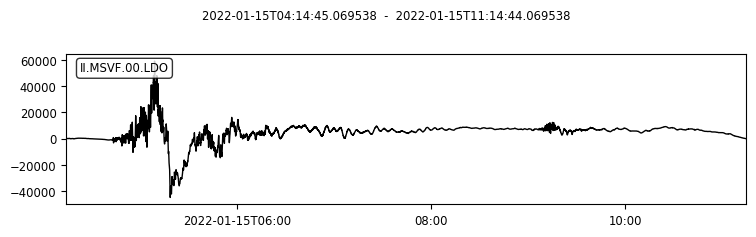

II.MSVF.00.LDO: Filtered
II.MSVF.00.LDO: calib = 69.910800


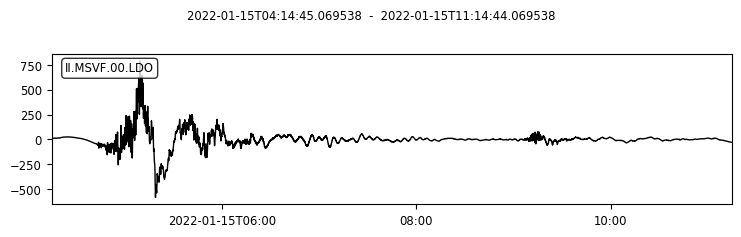

II.MSVF.00.LDO: max amp = 58999 counts before, and 787.3 units after
               network: II
               station: MSVF
              location: 00
               channel: LDO
             starttime: 2022-01-15T04:14:45.069538Z
               endtime: 2022-01-15T11:14:44.069538Z
         sampling_rate: 1.0
                 delta: 1.0
                  npts: 25200
                 calib: 1.0
_fdsnws_dataselect_url: http://service.iris.edu/fdsnws/dataselect/1/query
               _format: MSEED
                filter: AttribDict({'freqmin': 0.0003, 'freqmax': 0.5, 'zerophase': True})
               history: ['padded', 'detrended', 'tapered', 'bandpass', 'unpadded']
                 mseed: AttribDict({'dataquality': 'M', 'number_of_records': 12, 'encoding': 'STEIM2', 'byteorder': '>', 'record_length': 4096, 'filesize': 49152})
       originalEndTime: 2022-01-15T11:14:44.069538Z
     originalStartTime: 2022-01-15T04:14:45.069538Z
            processing: ["ObsPy 0.0.0+archive: detrend(o

In [108]:
import numpy as np
for tr_original in st:
    tr = tr_original.copy()
    response = inv.get_response(tr.id, otime)
    try:
        calib = response.instrument_sensitivity.value 
    except:
        continue
    tr.detrend()
    tr.plot()
    maxcounts = np.max(np.abs(tr.data))
    clean_trace(tr, taperFraction=0.05, filterType="bandpass", freq=[0.0003, 0.9], \
        corners=4, zerophase=True, inv=None) 
    print('%s: Filtered' % tr.id)
    maxunits = np.max(np.abs(tr.data))
    print('%s: calib = %f' % (tr.id, calib))
    tr.data = tr.data / calib
    maxunits = np.max(np.abs(tr.data))
    tr.plot(); 
    print('%s: max amp = %.0f counts before, and %.1f Pa after' % (tr.id, maxcounts, maxunits)) 
    print(tr.stats)

In [122]:
fdsnClient = Client("IRIS")
DATA_ROOT = '/home/thompsong/DATA/Tonga202201'
searchRadiusDeg = 10.0

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt = otime
endt = otime + 7 * 3600 # get 34 hours of data, since this is approximate time for sound waves to circle the earth


chanstring = 'LH?'
st, inv = get_inventory_and_waveforms(fdsnClient, searchRadiusDeg, olat, olon, startt, endt, chanstring, DATA_ROOT, overwrite=True)

/home/thompsong/DATA/Tonga202201/LH?_within_10_degrees.xml /home/thompsong/DATA/Tonga202201/LH?_within_10_degrees.mseed
Trying to load inventory from 2022/01/15 04:14 to 2022/01/15 11:14
inventory saved to /home/thompsong/DATA/Tonga202201/LH?_within_10_degrees.xml
['G.FUTU.LHE', 'G.FUTU.LHN', 'G.FUTU.LHZ', 'II.MSVF.LH1', 'II.MSVF.LH2', 'II.MSVF.LHZ', 'II.MSVF.LH1', 'II.MSVF.LH2', 'II.MSVF.LHZ', 'IU.AFI.LH1', 'IU.AFI.LH2', 'IU.AFI.LHZ', 'IU.AFI.LH1', 'IU.AFI.LH2', 'IU.AFI.LHZ', 'IU.RAO.LH1', 'IU.RAO.LH2', 'IU.RAO.LHZ', 'IU.RAO.LH1', 'IU.RAO.LH2', 'IU.RAO.LHZ']
waveform downloaded for  G.FUTU.LHE
waveform downloaded for  G.FUTU.LHN
waveform downloaded for  G.FUTU.LHZ
waveform downloaded for  II.MSVF.LH1
More than 1 Trace
waveform downloaded for  II.MSVF.LH2
More than 1 Trace
waveform downloaded for  II.MSVF.LHZ
More than 1 Trace
waveform downloaded for  II.MSVF.LH1
More than 1 Trace
waveform downloaded for  II.MSVF.LH2
More than 1 Trace
waveform downloaded for  II.MSVF.LHZ
More than 1 Tr

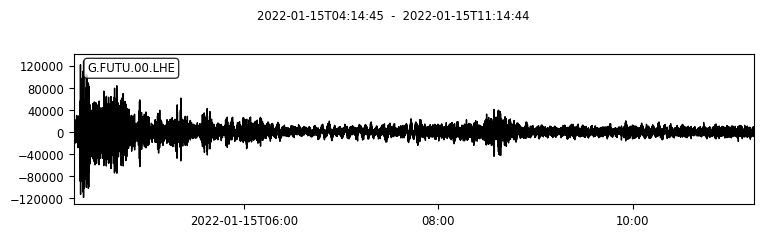

reconstituted


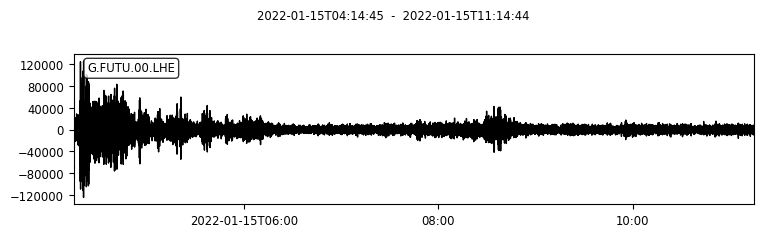

G.FUTU.00.LHE: max amp = 128450 counts before, and 6.3e-05 m/s after


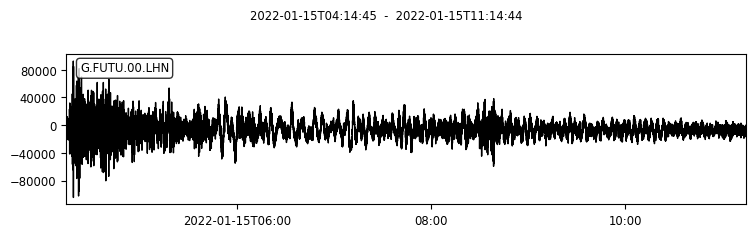

reconstituted


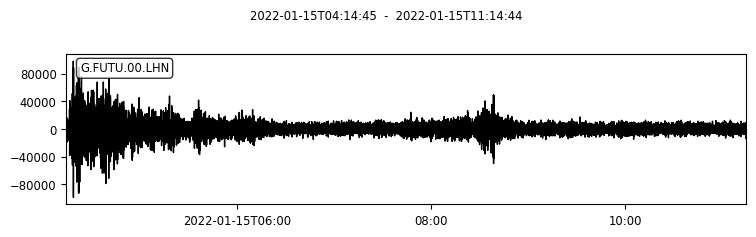

G.FUTU.00.LHN: max amp = 104443 counts before, and 4.9e-05 m/s after


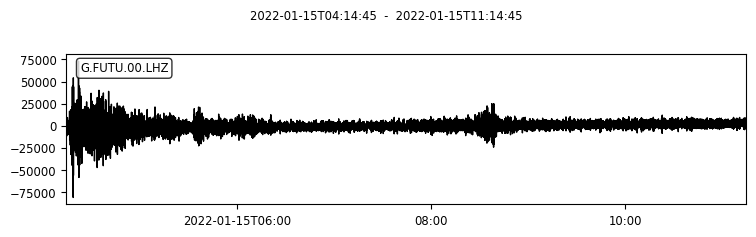

reconstituted


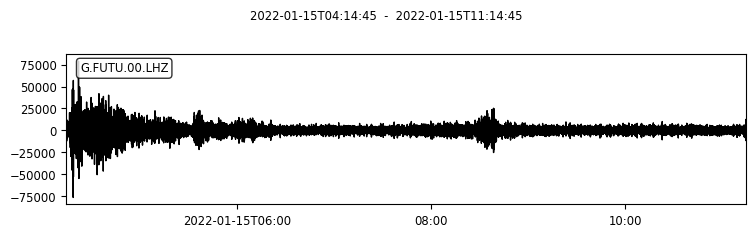

G.FUTU.00.LHZ: max amp = 81373 counts before, and 3.9e-05 m/s after


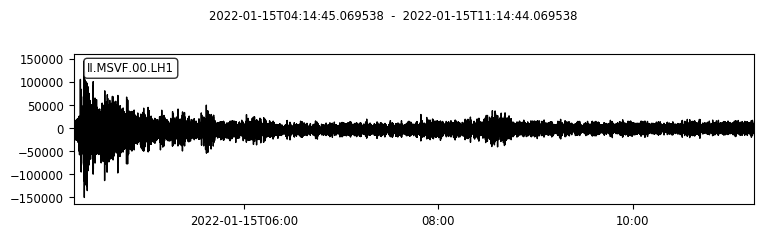

high pass filtered
II.MSVF.00.LH1: calib = 3759900000.000000 applied


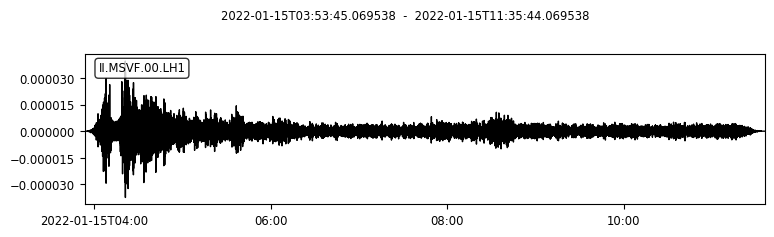

II.MSVF.00.LH1: max amp = 150541 counts before, and 4.0e-05 m/s after


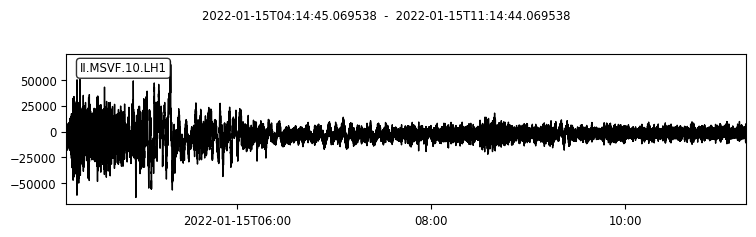

high pass filtered
II.MSVF.10.LH1: calib = 1967240000.000000 applied


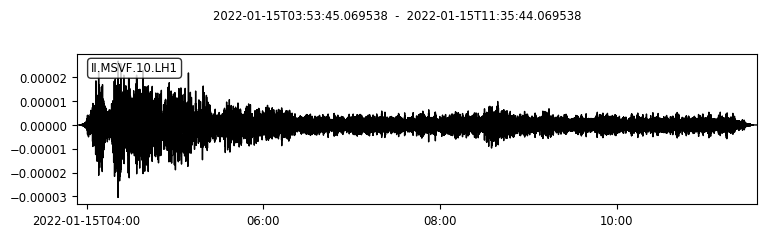

II.MSVF.10.LH1: max amp = 68219 counts before, and 3.0e-05 m/s after


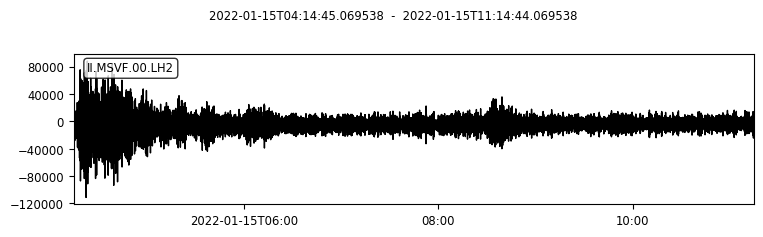

high pass filtered
II.MSVF.00.LH2: calib = 3715620000.000000 applied


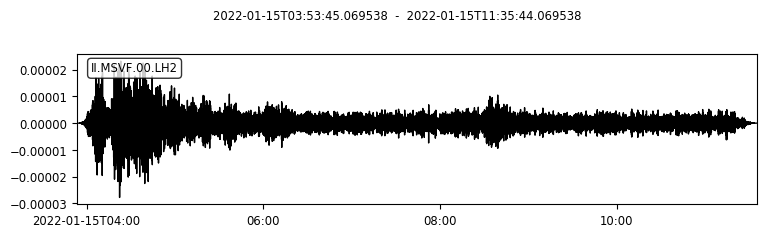

II.MSVF.00.LH2: max amp = 111227 counts before, and 2.8e-05 m/s after


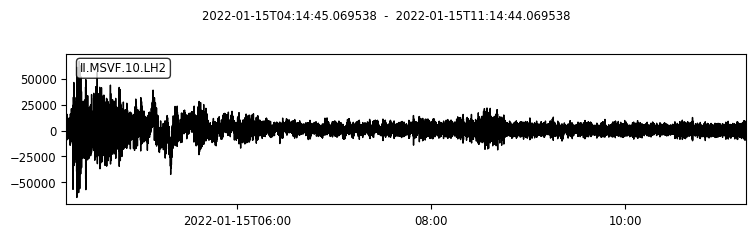

high pass filtered
II.MSVF.10.LH2: calib = 1945400000.000000 applied


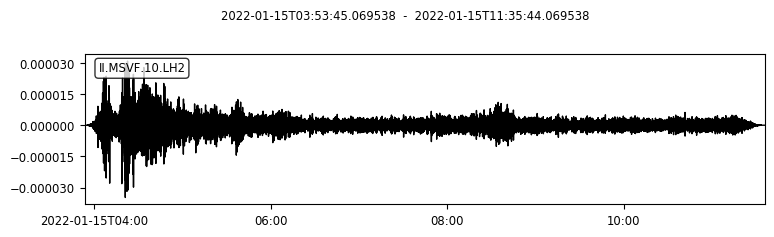

II.MSVF.10.LH2: max amp = 66838 counts before, and 3.5e-05 m/s after


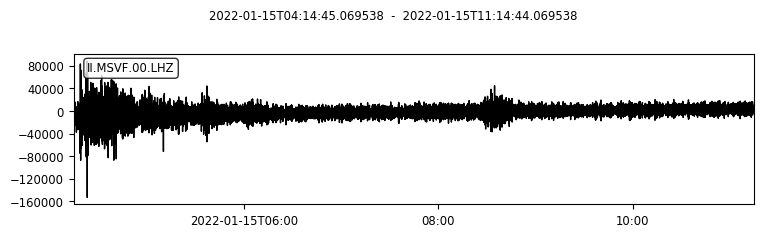

high pass filtered
II.MSVF.00.LHZ: calib = 3636040000.000000 applied


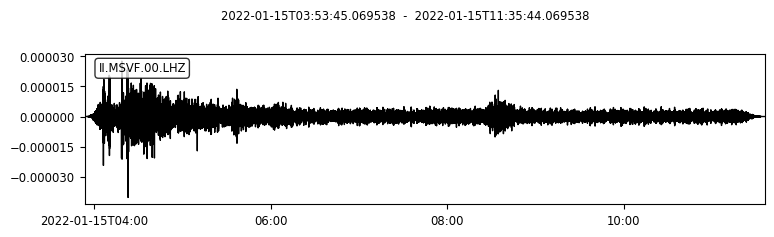

II.MSVF.00.LHZ: max amp = 153085 counts before, and 4.0e-05 m/s after


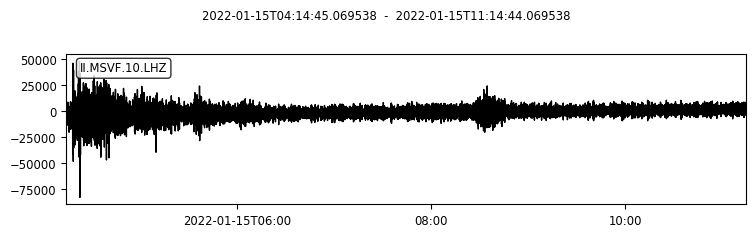

high pass filtered
II.MSVF.10.LHZ: calib = 1977160000.000000 applied


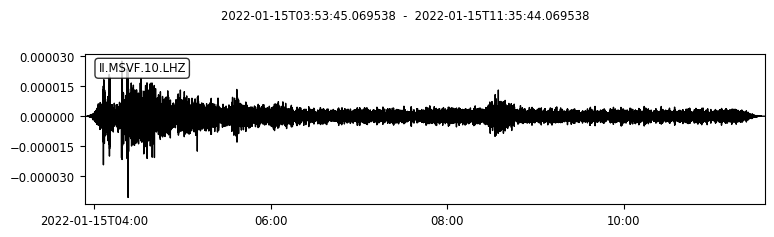

II.MSVF.10.LHZ: max amp = 83061 counts before, and 4.1e-05 m/s after


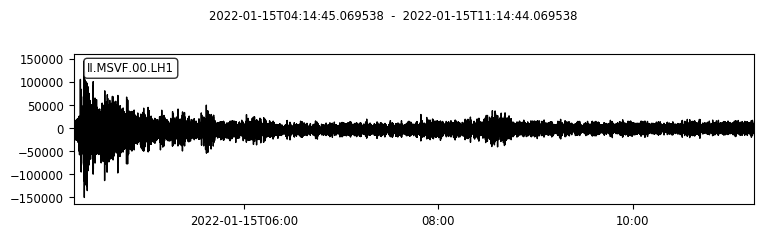

high pass filtered
II.MSVF.00.LH1: calib = 3759900000.000000 applied


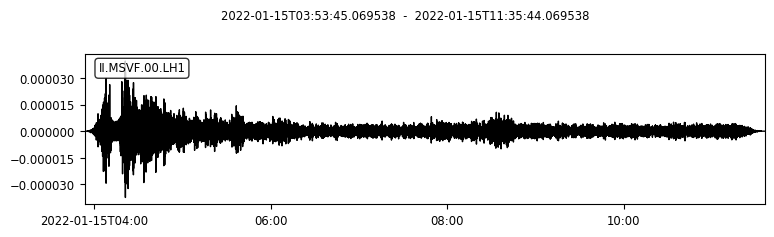

II.MSVF.00.LH1: max amp = 150541 counts before, and 4.0e-05 m/s after


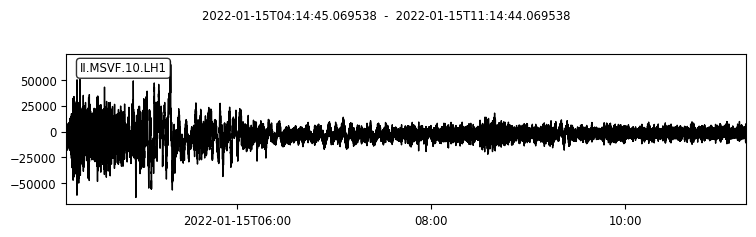

high pass filtered
II.MSVF.10.LH1: calib = 1967240000.000000 applied


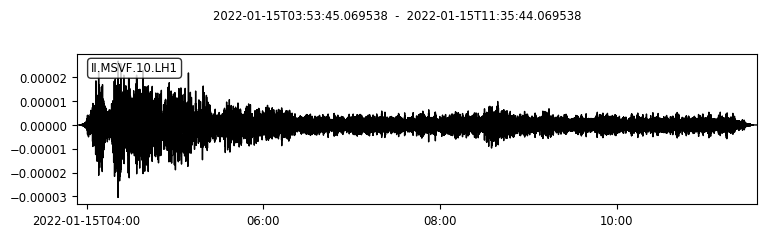

II.MSVF.10.LH1: max amp = 68219 counts before, and 3.0e-05 m/s after


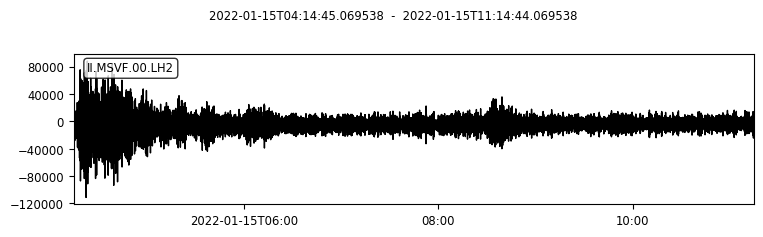

high pass filtered
II.MSVF.00.LH2: calib = 3715620000.000000 applied


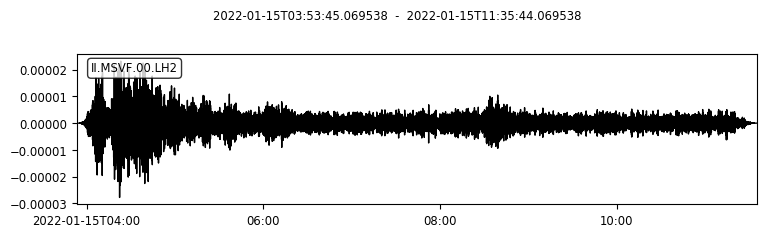

II.MSVF.00.LH2: max amp = 111227 counts before, and 2.8e-05 m/s after


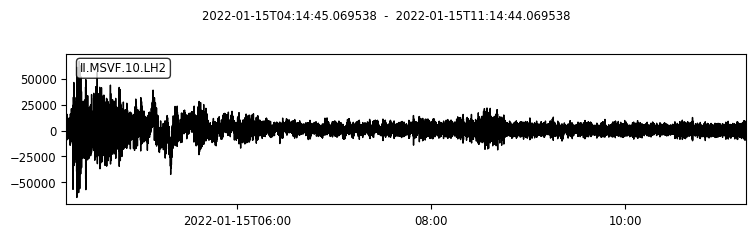

high pass filtered
II.MSVF.10.LH2: calib = 1945400000.000000 applied


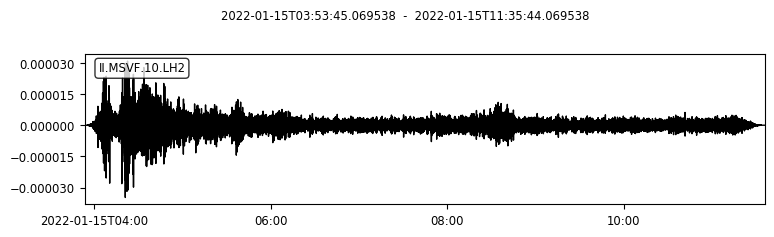

II.MSVF.10.LH2: max amp = 66838 counts before, and 3.5e-05 m/s after


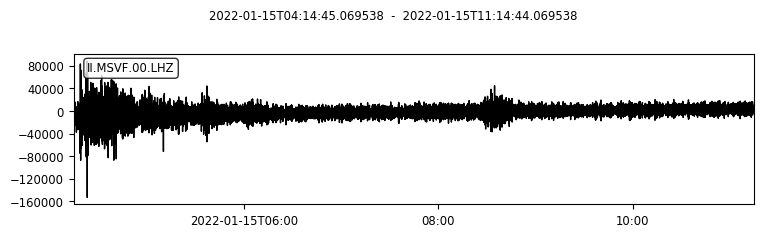

high pass filtered
II.MSVF.00.LHZ: calib = 3636040000.000000 applied


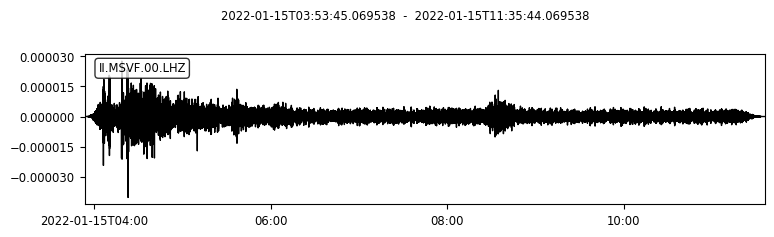

II.MSVF.00.LHZ: max amp = 153085 counts before, and 4.0e-05 m/s after


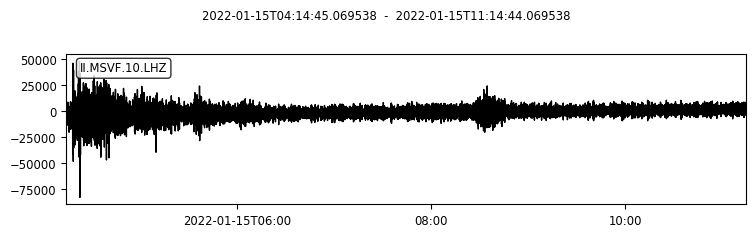

high pass filtered
II.MSVF.10.LHZ: calib = 1977160000.000000 applied


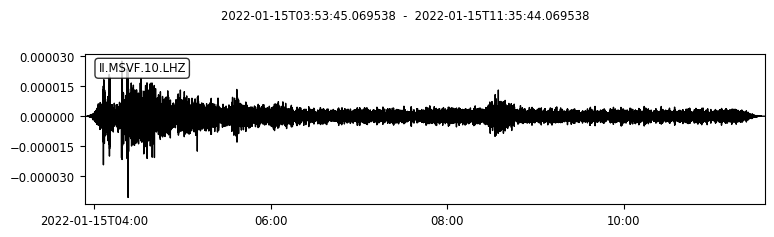

II.MSVF.10.LHZ: max amp = 83061 counts before, and 4.1e-05 m/s after


In [129]:
import numpy as np
freq = [0.01, 0.9]
for tr_original in st:
    tr = tr_original.copy()
    tr.detrend()
    tr.plot()
    maxcounts = np.max(np.abs(tr.data))
    try:
        clean_trace(tr, taperFraction=0.05, filterType="bandpass", freq=freq, \
            corners=4, zerophase=True, inv=inv)
        print('reconstituted')
    except:
        clean_trace(tr, taperFraction=0.05, filterType="bandpass", freq=freq, \
            corners=4, zerophase=True, inv=None)   
        print('high pass filtered')
        response = inv.get_response(tr.id, otime)
        calib = response.instrument_sensitivity.value
        print('%s: calib = %f applied' % (tr.id, calib))
        #tr.data = tr.data / calib
    maxunits = np.max(np.abs(tr.data))
    tr.plot(); 
    print('%s: max amp = %.0f counts before, and %.1e m/s after' % (tr.id, maxcounts, maxunits)) 
    #print(tr.stats)

II.MSVF.00.LDI, 9.3e+05, 3.1e+03, 0.0e+00
II.MSVF.00.LDO, 8.7e+05, 2.2e+04, 3.1e+02
II.MSVF.00.LH1, 1.5e+05, 1.5e+05, 0.0e+00
II.MSVF.00.LH2, 1.1e+05, 1.1e+05, 0.0e+00
II.MSVF.00.LHZ, 1.5e+05, 1.5e+05, 0.0e+00
II.MSVF.10.LH1, 5.9e+04, 5.7e+04, 0.0e+00
II.MSVF.10.LH2, 6.7e+04, 6.6e+04, 0.0e+00
II.MSVF.10.LHZ, 7.9e+04, 7.9e+04, 0.0e+00


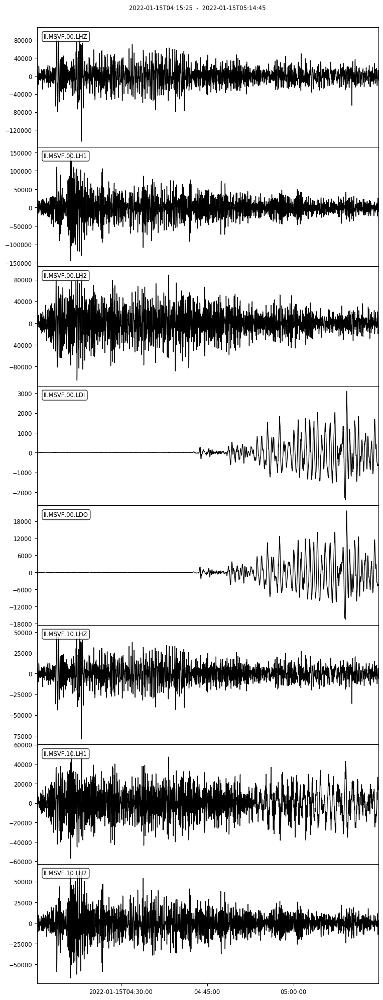

In [121]:
stiris = obspy.core.read(os.path.join(DATA_ROOT, 'MINISEED', '2022-01-15-ms_2058-tonga-islands.miniseed'))

msvf=stiris.select(station='MSVF')

#print(msvf)

for tr in msvf:
    #print(tr)
    maxcounts = np.max(np.abs(tr.data))
    clean_trace(tr, taperFraction=0.05, filterType="highpass", freq=0.01, \
        corners=4, zerophase=True, inv=None) 
    maxfiltered = np.max(np.abs(tr.data))
    try:
        response = inv.get_response(tr.id, otime)
        calib = response.instrument_sensitivity.value
        maxunits = np.max(np.abs(tr.data/calib))
    except:
        maxunits = 0
    print("%s, %.1e, %.1e, %.1e" % (tr.id, maxcounts, maxfiltered, maxunits))

msvf.plot(equal_scale=False);

In [137]:
fdsnClient = Client("IRIS")
DATA_ROOT = '/home/thompsong/DATA/Tonga202201'
searchRadiusDeg = 90.0

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt = otime
endt = otime + 34 * 3600 # get 34 hours of data, since this is approximate time for sound waves to circle the earth


chanstring = 'LDF'
st, inv = get_inventory_and_waveforms(fdsnClient, searchRadiusDeg, olat, olon, startt, endt, chanstring, DATA_ROOT, overwrite=True)

/home/thompsong/DATA/Tonga202201/LDF_within_90_degrees.xml /home/thompsong/DATA/Tonga202201/LDF_within_90_degrees.mseed
Trying to load inventory from 2022/01/15 04:14 to 2022/01/16 14:14
inventory saved to /home/thompsong/DATA/Tonga202201/LDF_within_90_degrees.xml
['AE.214A.LDF', 'AK.C16K.LDF', 'AK.C18K.LDF', 'AK.CAPN.LDF', 'AK.CHUM.LDF', 'AK.COLD.LDF', 'AK.CUT.LDF', 'AK.D17K.LDF', 'AK.E18K.LDF', 'AK.E19K.LDF', 'AK.F15K.LDF', 'AK.F18K.LDF', 'AK.F20K.LDF', 'AK.F21K.LDF', 'AK.G17K.LDF', 'AK.G19K.LDF', 'AK.G23K.LDF', 'AK.G24K.LDF', 'AK.H16K.LDF', 'AK.H17K.LDF', 'AK.H20K.LDF', 'AK.H21K.LDF', 'AK.H22K.LDF', 'AK.H23K.LDF', 'AK.H24K.LDF', 'AK.HARP.LDF', 'AK.HDA.LDF', 'AK.HOM.LDF', 'AK.I21K.LDF', 'AK.I23K.LDF', 'AK.I26K.LDF', 'AK.I27K.LDF', 'AK.J17K.LDF', 'AK.J19K.LDF', 'AK.J20K.LDF', 'AK.J25K.LDF', 'AK.J26L.LDF', 'AK.K13K.LDF', 'AK.K15K.LDF', 'AK.K20K.LDF', 'AK.K24K.LDF', 'AK.K27K.LDF', 'AK.L14K.LDF', 'AK.L16K.LDF', 'AK.L17K.LDF', 'AK.L18K.LDF', 'AK.L19K.LDF', 'AK.L20K.LDF', 'AK.L22K.LDF', 'A

reconstituted
AK.CAPN.EP.LDF: max amp = 116271 counts before, and 4.1e+00 units after
reconstituted
AK.CHUM.EP.LDF: max amp = 1283344 counts before, and 4.3e+01 units after
reconstituted
AK.COLD.EP.LDF: max amp = 1463252 counts before, and 3.9e+01 units after
reconstituted
AK.CUT.EP.LDF: max amp = 1707830 counts before, and 6.3e+01 units after
reconstituted
AK.D17K.EP.LDF: max amp = 4708155 counts before, and 5.5e+01 units after
reconstituted
AK.F15K.EP.LDF: max amp = 3938031 counts before, and 5.8e+01 units after
reconstituted
AK.F18K.EP.LDF: max amp = 2075652 counts before, and 3.7e+01 units after
reconstituted
AK.G17K.EP.LDF: max amp = 1508526 counts before, and 3.3e+01 units after
reconstituted
AK.G19K.EP.LDF: max amp = 1476748 counts before, and 3.5e+01 units after
reconstituted
AK.G24K.EP.LDF: max amp = 2411126 counts before, and 6.6e+01 units after
reconstituted
AK.H16K.EP.LDF: max amp = 2399356 counts before, and 4.2e+01 units after
reconstituted
AK.H17K.EP.LDF: max amp = 20199

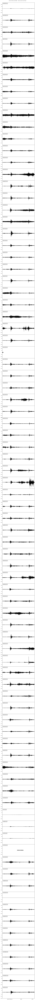

In [147]:
import numpy as np
freq = [0.001, 0.9]
st2 = obspy.core.Stream()
for tr_original in st:
    tr = tr_original.copy()
    st2 = st2.append(tr)
    try:
        st2.merge(method=1, fill_value=0)
    except:
        st2.remove(tr)
        pass
st_good = obspy.core.Stream()
for tr_original in st2:
    tr = tr_original.copy()
    n = np.count_nonzero(tr.data==0)
    if n/len(tr.data) > 0.1:
        st2.remove(tr_original)
        continue
    tr.detrend()
    #tr.plot()
    maxcounts = np.max(np.abs(tr.data))
    tr.filter("highpass", freq=0.001)
    try:
        tr.remove_response(inventory=inv)
        #clean_trace(tr, taperFraction=0.05, filterType="bandpass", freq=freq, \
         #   corners=4, zerophase=True, inv=inv)
        print('reconstituted')
    except:
        #clean_trace(tr, taperFraction=0.05, filterType="bandpass", freq=freq, \
        #    corners=4, zerophase=True, inv=None)   
        #print('high pass filtered')
        #response = inv.get_response(tr.id, otime)
        #calib = response.instrument_sensitivity.value
        #print('%s: calib = %f applied' % (tr.id, calib))
        #tr.data = tr.data / calib
        pass
    st_good.append(tr)
    maxunits = np.max(np.abs(tr.data))
    #tr.plot(); 
    print('%s: max amp = %.0f counts before, and %.1e units after' % (tr.id, maxcounts, maxunits)) 
    #print(tr.stats)

st_good.plot(equal_scale=True);

In [101]:
np.sqrt(7) * 787 * 100

208220.6281807833

In [96]:
15000*26.5

397500.0

In [102]:
# ok. next let us try to examine other blasts. and expand to looking at infrasound stations within 50 degrees.

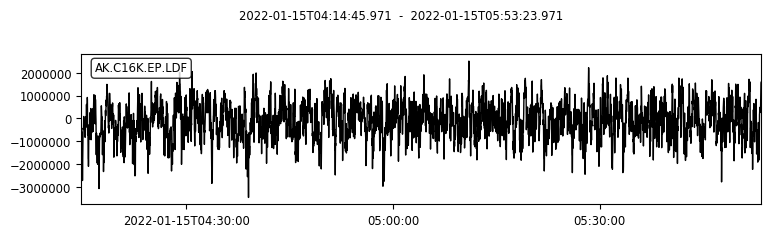

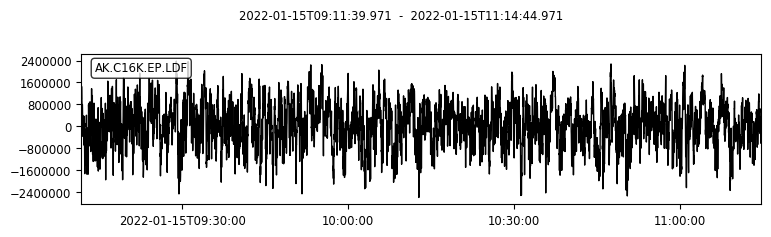

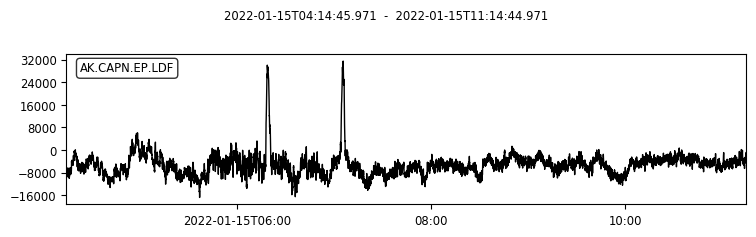

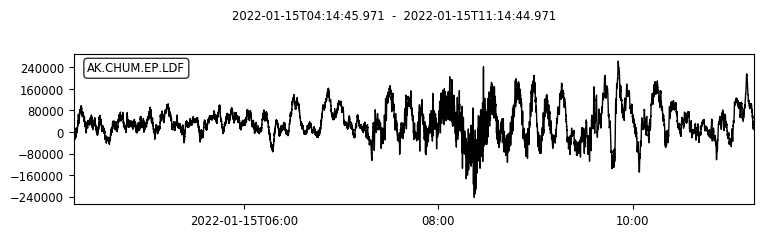

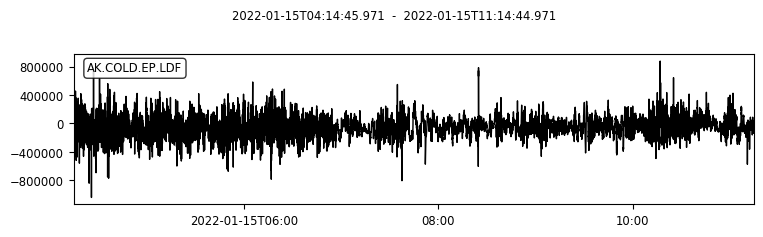

...

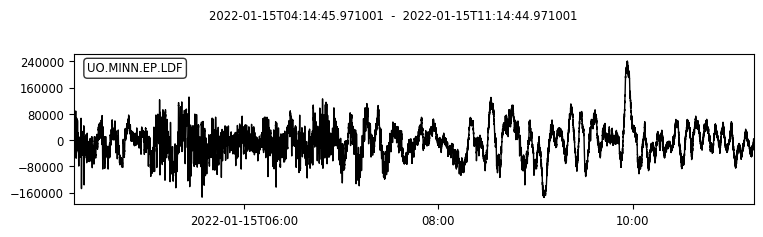

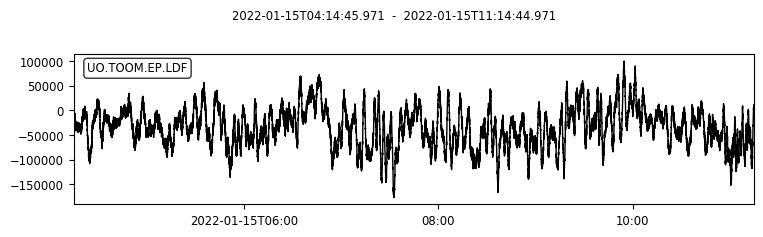

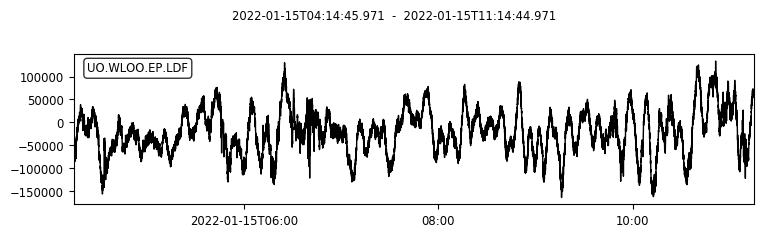

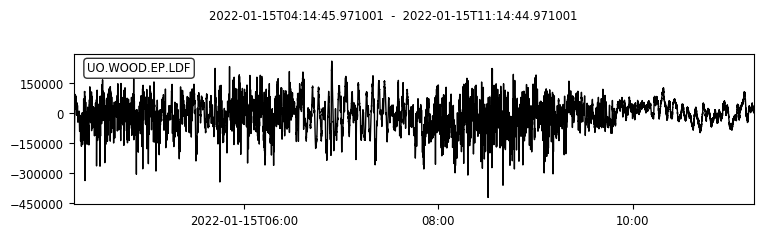

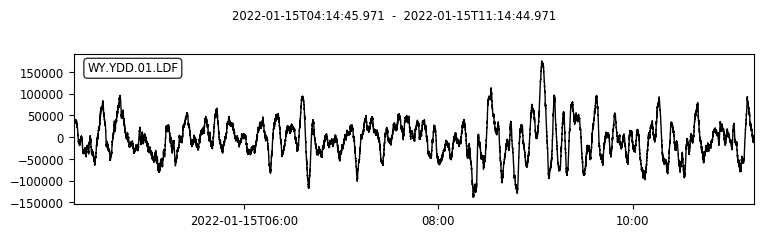

In [135]:
for tr in st:
    tr.plot()